# **🐩 Dog Breed Classification - Multiclass Classification Using TensorFlow**

This notebook shows the steps to building a multiclass image classifier to classify different dog breeds using TensorFlow and TensorFlow Hub.

### **🐾 1) Problem**

Identifying the breed of a dog based on an image of said dog (out of 120 possible breeds).

If we take a picture of a dog, using our trained classifier, could we successfully classify the breed of the dog in the picture?

### **🐾 2) Data**

The dataset can be found on Kaggle (Dog Breed Identification Competition): https://www.kaggle.com/competitions/dog-breed-identification/

### **🐾 3) Evaluation**

Based on Kaggle's evaluation criteria the classifier is evaluated on multi class log loss. The final result of this project is a file containing prediction probabilities for each dog breed out of the 120 possible breeds for each test image.

### **🐾 4) Features**

Some information about the data:
* Image data (unstructured data) -> Deep Learning/Transfer Learning solutions
* 120 different classes (120 breeds)
* ~10000+ unique records (images) in the training (labeled) as well as test (no labels) set respectively



In [ ]:
#Unzipping the data

# !unzip "/content/drive/MyDrive/personal projects/dog_breed_identification/data/dog-breed-identification.zip" -d "/content/drive/MyDrive/personal projects/dog_breed_identification/data/"

## **Data Preprocessing - Transforming Images into Tensors**

### **Simple Exploratory Data Analysis**

I will work with a TensorFlow version 2.15 (2.x). I will use TensorFlow Hub as well as a GPU since running neural networks takes a lot more computing power. Processing image data is a lot more costly since there is nearly 1 GB worth of data.

In [4]:
# !pip uninstall -y tensorflow keras

In [5]:
# !pip install tensorflow==2.15.0

In [6]:
# !pip install keras==2.15.0

In [7]:
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow import keras

print("TensorFlow version:", tf.__version__)
print("TensorFlow Hub version:", hub.__version__)

TensorFlow version: 2.15.0
TensorFlow Hub version: 0.16.1


In [ ]:
#Checking for GPU availability

print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU not available


To connect to a GPU: Runtime -> Change runtime type -> Hardware Accelerator -> GPU -> Save

In [8]:
import tensorflow as tf
import tensorflow_hub as hub
print("TensorFlow version:", tf.__version__)
print("TensorFlow Hub version:", hub.__version__)

TensorFlow version: 2.15.0
TensorFlow Hub version: 0.16.1


In [14]:
#Checking for GPU availability

print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [16]:
sns.set_style("whitegrid")
sns.set_palette("tab20c")

In [17]:
sns.color_palette()

[(0.19215686274509805, 0.5098039215686274, 0.7411764705882353),
 (0.4196078431372549, 0.6823529411764706, 0.8392156862745098),
 (0.6196078431372549, 0.792156862745098, 0.8823529411764706),
 (0.7764705882352941, 0.8588235294117647, 0.9372549019607843),
 (0.9019607843137255, 0.3333333333333333, 0.050980392156862744),
 (0.9921568627450981, 0.5529411764705883, 0.23529411764705882),
 (0.9921568627450981, 0.6823529411764706, 0.4196078431372549),
 (0.9921568627450981, 0.8156862745098039, 0.6352941176470588),
 (0.19215686274509805, 0.6392156862745098, 0.32941176470588235),
 (0.4549019607843137, 0.7686274509803922, 0.4627450980392157),
 (0.6313725490196078, 0.8509803921568627, 0.6078431372549019),
 (0.7803921568627451, 0.9137254901960784, 0.7529411764705882),
 (0.4588235294117647, 0.4196078431372549, 0.6941176470588235),
 (0.6196078431372549, 0.6039215686274509, 0.7843137254901961),
 (0.7372549019607844, 0.7411764705882353, 0.8627450980392157),
 (0.8549019607843137, 0.8549019607843137, 0.9215686274509803),
 (0.38823529411764707, 0.38823529411764707, 0.38823529411764707),
 (0.5882352941176471, 0.5882352941176471, 0.5882352941176471),
 (0.7411764705882353, 0.7411764705882353, 0.7411764705882353),
 (0.8509803921568627, 0.8509803921568627, 0.8509803921568627)]

In [18]:
palette = sns.color_palette()

In [19]:
labels_csv = pd.read_csv("/content/drive/MyDrive/personal projects/dog_breed_identification/data/labels.csv")
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [20]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,fff43b07992508bc822f33d8ffd902ae,scottish_deerhound
freq,1,126


**How many dogs (images) are there per breed?**

In [21]:
labels_csv["breed"].value_counts()

breed
scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
komondor                 67
brabancon_griffon        67
eskimo_dog               66
briard                   66
Name: count, Length: 120, dtype: int64

**What are the dog breeds with the most instances?**

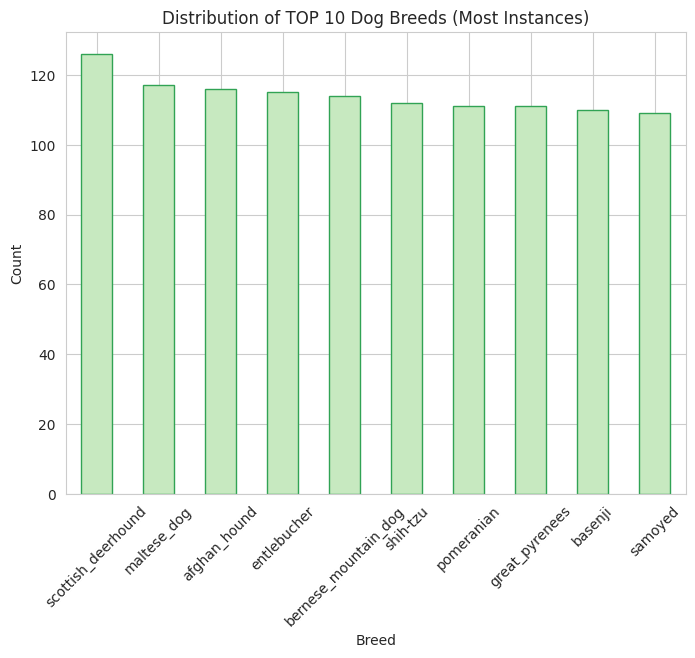

In [22]:
labels_csv["breed"].value_counts().nlargest(10).plot.bar(figsize=(8, 6), color=palette[11], edgecolor=palette[8])
plt.title('Distribution of TOP 10 Dog Breeds (Most Instances)')
plt.xlabel('Breed')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

**What is the average instance per breed?**

In [23]:
labels_csv["breed"].value_counts().mean()

85.18333333333334

In [24]:
labels_csv["breed"].value_counts().median()

82.0

The more instances there are in a class (breed type) the better the model will predict the given breed. The recommended instance per class is at least 10 instances (datapoints) per class. For training purposes, at least 100, as recommended by Google. On average, each dog breed has around 85 images in the case of the Dog Breed Identification dataset.

In [25]:
labels_csv["breed"].head()

0         boston_bull
1               dingo
2            pekinese
3            bluetick
4    golden_retriever
Name: breed, dtype: object

### **Transforming Images and Labels into Accessible Formats**

**Transforming Filenames/Filepaths into an Accessible Format**

Next I will get a list of all the image file path names.

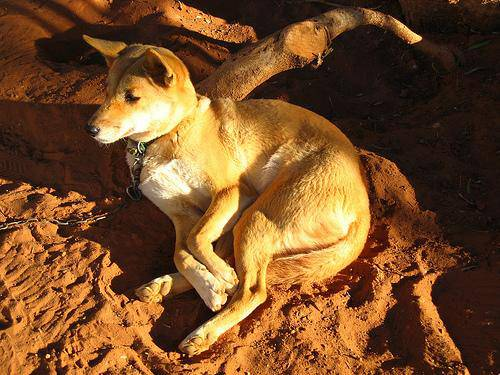

In [26]:
#Viewing an image
from IPython.display import Image
Image("drive/MyDrive/personal projects/dog_breed_identification/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

In [27]:
#Creating pathnames from image ID's

filenames = ["drive/MyDrive/personal projects/dog_breed_identification/data/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/MyDrive/personal projects/dog_breed_identification/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/personal projects/dog_breed_identification/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/personal projects/dog_breed_identification/data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/personal projects/dog_breed_identification/data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/personal projects/dog_breed_identification/data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/personal projects/dog_breed_identification/data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/personal projects/dog_breed_identification/data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/personal projects/dog_breed_identification/data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/personal projects/dog_breed_identification/data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/per

In [28]:
import os
os.listdir("drive/MyDrive/personal projects/dog_breed_identification/data/train/")[:10]

['e15b8ff62b03b844e352014b16881251.jpg',
 'e89e6cbb5d616ef9904675b9e6db06b3.jpg',
 'dd0834325da4d5500f22614308e76d9f.jpg',
 'e224c29118a187dccba77b4aaa355767.jpg',
 'e47cac448a3250262bee5660d393da9a.jpg',
 'e36c116cdff32db5d5b87b3c789ce46c.jpg',
 'de4cf4fcb0bed47267572b694a77060d.jpg',
 'e4a43542e9d62fff9a6a95e3ce39942d.jpg',
 'df3ba5eee0c008a3284158bb89350673.jpg',
 'e5861b5d5b08d0e03ca3e3785e44cc88.jpg']

In [29]:
#Checking to see if I saved all the file names for the train dataset

import os

if len(os.listdir("drive/MyDrive/personal projects/dog_breed_identification/data/train/")) == len(filenames):
  print("The number of file names matches the number of image files.")
  print("Proceed with image processing.")
else:
  print("The number of file names does not match the number of image files.")
  print("Check for errors.")

The number of file names matches the number of image files.
Proceed with image processing.


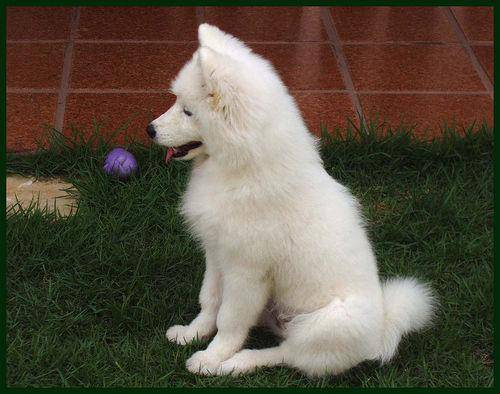

In [30]:
#Checking once more

Image(filenames[9999])

In [31]:
labels_csv["breed"][9999]

'samoyed'

Since we transformed our training image file paths into a list we can now work on transforming the labels into numericals.

**Transforming Labels into a Numerical Format**

In [32]:
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [33]:
len(labels)

10222

In [34]:
#Checking to see if I have all the labels for the train dataset

if len(labels) == len(filenames):
  print("The number of labels matches the number of image files.")
  print("Proceed with image processing.")
else:
  print("The number of labels does not match the number of image files.")
  print("Check for errors.")

The number of labels matches the number of image files.
Proceed with image processing.


First let's fin a list of all the unique label names.

In [35]:
#Finding the unique label names

unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [36]:
len(unique_breeds)

120

In [37]:
#Turning a single label into an array of booleans

print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

To turn all datapoints into numbers the approach I will take is to first turn each label into it's own boolean array. Each array marks which of the 120 unique breeds the given label (dog image) is.

In [38]:
#Turning every label into a boolean array of it's own

boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [39]:
len(boolean_labels)

10222

In [40]:
#Turning the example boolean array into integers

print(labels[0]) #Original example label
print(np.where(unique_breeds == labels[0])) #Index of example label
print(boolean_labels[0].argmax()) #Index of where the example label occurs in it's boolean array
print(boolean_labels[0].astype(int)) #Integer array of example label, 1 marks the spot of example label

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


Now that I have all of the data in an accessible format I will create the train (already separated) and validation (custom) sets.

**Creating a Validation Set**

In [41]:
filenames[:1]

['drive/MyDrive/personal projects/dog_breed_identification/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg']

In [42]:
boolean_labels[:1]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False])]

In [43]:
#Creating X and y

X  = filenames
y  = boolean_labels

In [44]:
len(filenames)

10222

First, I will start off experimenting with around ~1000 images and increase the number of samples as needed.

In [45]:
#Setting the number of images to use for experimenting

NUM_IMAGES = 1000 #@param {type: "slider", min: 1000, max: 10000, step: 1000}

In [46]:
#Splitting the data into training and validation sets

from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [47]:
#Checking out the data

X_train[:1], y_train[:1], X_val[:1], y_val[:1]

(['drive/MyDrive/personal projects/dog_breed_identification/data/train/00bee065dcec471f26394855c5c2f3de.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, Fa

###**Turning Images and Labels into Tensors**

First, I will transforming an image example into tensors.

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
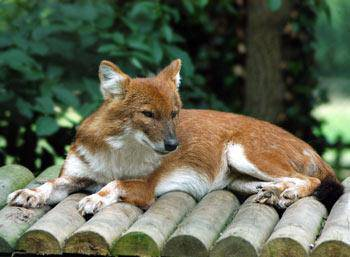

In [48]:
#Converting image to NumPy array

from matplotlib.pyplot import imread

image = imread(filenames[42])
image

In [49]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [50]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

**Turning Images into Tensors**

Function:

  1) Takes an image filepath as input

  2) Uses TensorFlow to read said file and save it to an `image` variable

  3) Turns `image` variable into Tensors

  4) Normalizes `image` variable (Scales; converts color channel values from 0-255 to 0-1)

  5) Resizes `image` variable so that it is in the size of (224, 224)

  6) Returns final `image` variable

In [51]:
#Defining image size

IMG_SIZE = 224

#Creating a custom function to turn images into tensors; takes image file path and turns image into tensors

def process_image(image_path, img_size=IMG_SIZE):

  #Reading image file path

  image = tf.io.read_file(image_path)

  #Turning image (jpg) into tensors with 3 color channels (RGB)

  image = tf.image.decode_jpeg(image, channels=3)

  #Scaling tensor color channel values from 0-255 to 0-1

  image = tf.image.convert_image_dtype(image, tf.float32)

  #Resizing image to desired size

  image = tf.image.resize(image, size=[img_size, img_size])

  return image

**Creating Image and Label Tuples**

For a memory efficient way of processing the data I need to batch the data into batches of 32. For an effective use of TensorFlow I need to transform the data into tuples like this: (image, label).




In [52]:
#Creating a function that return a tuple of tensors in the form of: (image, label)
#Takes image file path name and label, processes image and return a tuple of the inputs

def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [53]:
#Turning an example image and it's label into a tuple

(process_image(X[42]), tf.constant(y[4]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

**Batching Data**

In [54]:
#Creating a function to batch the entire datset (X & y) into batches of 32

#Defining batch size

BATCH_SIZE = 32

#Creating a function to turn data into batches
#Creates data batches of image (X) and label (y) pairs
#Shuffles the data if it is training data, does not shuffle if it is validation data
#Accepts test data as input with no labels (y)

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):

  #For creating test data (no labels)

  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) #Only the filepaths (X), no  labels (y)
    data_batch = data.map(process_image).batch(BATCH_SIZE) #'process_image' function because we have no labels
    return data_batch

  #For creating validation data (data + labels), no need to shuffle

  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y))) #Filepaths (X) and labels (y)
    data_batch = data.map(get_image_label).batch(BATCH_SIZE) #'get_image_label' function because we have filepaths and labels
    return data_batch

  else:
    print("Creating training data batches...")

    #Turning filepaths (X) and labels (y) into tensors

    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))

    #Shuffling pathnames and labels before mapping the image processor function; faster than shuffling images

    data = data.shuffle(buffer_size=len(X))

    #Creating (image, label) tuples; turning image paths into preprocessed images

    data = data.map(get_image_label)

    #Turning the training data into batches

    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [55]:
#Creating training and validation data batches

train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [56]:
#Checking out the attributes of our  data batches

train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

**Visualizing Data Batches**

To better understand how the data looks inside the data batches I will create a custom function to visualize said data batches.

In [57]:
#Creating a function for viewing images in a data batch; displaying a plot of 25 images and their labels from a data batch

def show_25_images(images, labels):

  #Setting the figure size

  plt.figure(figsize=(15, 15))
  for i in range(25):
    ax = plt.subplot(5, 5, i+1) #rows, columns, index
    plt.imshow(images[i])
    plt.axis("off")
    plt.title(unique_breeds[labels[i].argmax()]) #Adding labels as titles

In [58]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [59]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images[0], train_labels[0]

(array([[[0.28466702, 0.44672933, 0.19707072],
         [0.2063306 , 0.3620722 , 0.11501336],
         [0.27897537, 0.4147206 , 0.18225439],
         ...,
         [0.43420988, 0.5440138 , 0.3144019 ],
         [0.47913235, 0.54774076, 0.31165072],
         [0.49772432, 0.5536412 , 0.31391805]],
 
        [[0.33391982, 0.48274758, 0.24362606],
         [0.2425701 , 0.38479248, 0.14575183],
         [0.43390557, 0.56259954, 0.33907363],
         ...,
         [0.42917365, 0.5461905 , 0.31058124],
         [0.464515  , 0.54184335, 0.30198863],
         [0.4689727 , 0.5348706 , 0.29168957]],
 
        [[0.33040193, 0.4498248 , 0.22876504],
         [0.3761105 , 0.49477294, 0.27930552],
         [0.35196102, 0.46752477, 0.25194055],
         ...,
         [0.45437956, 0.57182825, 0.33062845],
         [0.49973884, 0.59019744, 0.346057  ],
         [0.41475663, 0.49856263, 0.24881646]],
 
        ...,
 
        [[0.47780406, 0.66680044, 0.3140518 ],
         [0.09316487, 0.23589385, 0.07139

In [60]:
train_images.shape, train_labels.shape

((32, 224, 224, 3), (32, 120))

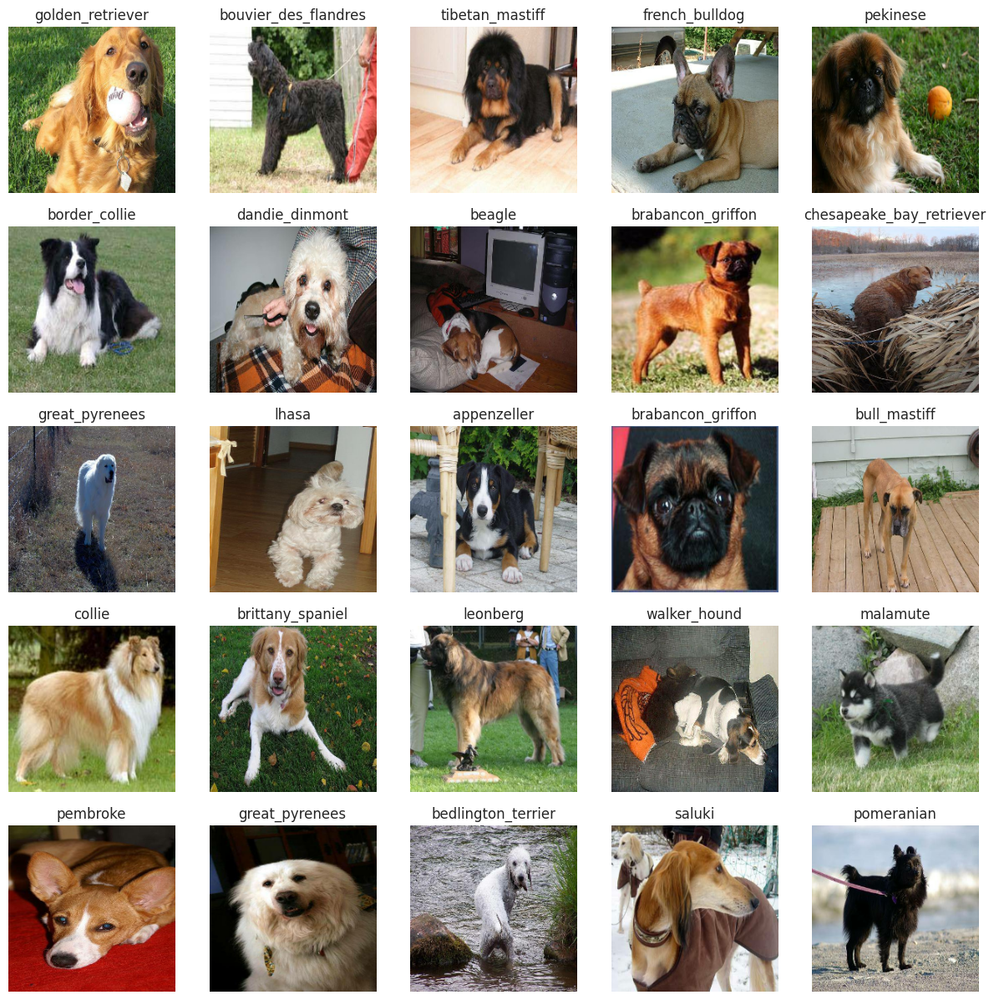

In [61]:
#Visualizing 25 images in a training batch

show_25_images(train_images, train_labels)

In [62]:
val_images, val_labels = next(val_data.as_numpy_iterator())

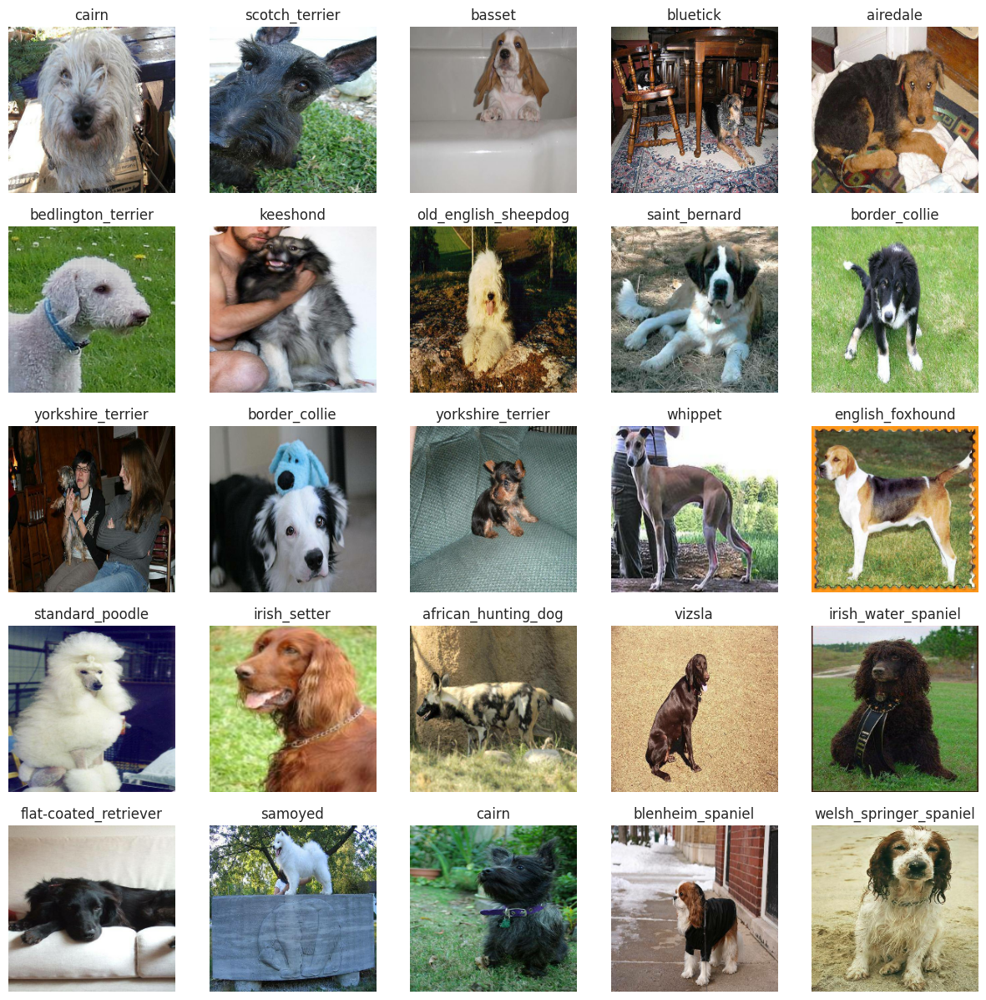

In [63]:
#Visualizing 25 images in a validation batch

show_25_images(val_images, val_labels)

## **Building a Deep Learning Model - Transfer Learning with TensorFlow Hub**

Before building the model let me define:
* The input shape that the model takes - image shape in the form of tensors
* The output shape that the model takes - image labels in the form of tensors
* The URL for the model that I want to use:
  * MobileNet V2 from TensorFlow Hub: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"

In [64]:
#Setting up input shape

INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, color channels
INPUT_SHAPE

[None, 224, 224, 3]

For this model I will be using the **`'MobileNet V2'`** image classification neural network architecture family from TensorFlow Hub.

In [65]:
#Setting up output shape

OUTPUT_SHAPE = len(unique_breeds)
OUTPUT_SHAPE

120

In [66]:
#Setting up model URL

MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now I will build my Keras Deep Learning model using the defined inputs, outputs and model URL. I will create a sequential model.

**Differences Between Keras Sequential and Functional Models**

**Sequential Model:**
- Simple and Intuitive: Best for beginners and simple models.
- Linear Stack of Layers: Layers are added one after another.
- Single Input and Output: Suitable for straightforward models.
- Limited Flexibility: Not suitable for models with multiple inputs, outputs, or shared layers.

**Functional Model:**
- Flexible and Powerful: Supports complex architectures.
- Graph Topology: Models are defined as directed acyclic graphs (DAG).
- Multiple Inputs and Outputs: Can handle complex layer connections.
- Reusability: Layers can be reused across different parts of the model.


**Building Model using Keras (Sequential)**

Function:

1) Takes the input shape, output shape and model as parameters

2) Defines the layers in a Keras model in a sequential way (step-by-step)

3) Compiles the model (says how it should be evaluation and improvement)

4) Builds the model (tells the model the input shape it'll get)

5) Returns the model

In [67]:
#Creating a function that builds the Keras model

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  #Setting up the model layers

  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (Input Layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax") # Layer 2 (Output Layer)
  ])

  #Compiling the model

  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  #Building the model

  model.build(INPUT_SHAPE)

  return model

In [68]:
model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [69]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


**Creating Callbacks**

Callbacks are helper functions for a model to use during training to save and check progress and to stop training a model early on if it stops improving. Early stopping helps prevent overfitting.

I will create two callbacks:
- One for TensorBoard to help track model progress
- Another one for early stopping

**Tensor Callback**

To set it up:

1) Load the TensorBoard notebook extension

2) Create a TensorBoard callback that is able to save logs to a directory and pass it to the model's `fit()` function

3) Visualize the model's training logs with the `%tensorboard` magic function (after training the model)

In [70]:
#Loading the TensorBoard notebook extension

%load_ext tensorboard

In [71]:
import datetime

#Creating a function to build a TensorBoard callback

def create_tensorboard_callback():

  #Create a 'logs' folder in Google Drive on the same level as the train/test data
  #Creating a log directory for storing TensorBoard logs
  #Making it so that the logs get tracked every time an experiment is run

  logdir = os.path.join("drive/MyDrive/personal projects/dog_breed_identification/data/logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

**Early Stopping Callback**

As soon as the model stops improving it's evaluation metric, the model stops training and this stops overfitting.

In [72]:
#Creating an early stopping callcack

early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)

## **Training a Deep Learning Model - Tiny Data (Subset of the Dataset)**

First I will train this model on 1000 images to test the model and make sure it works.

In [73]:
#Specifying the number of epochs

NUM_EPOCHS = 100 #@param {type: "slider", min: 10, max: 100, step: 10}

In [74]:
#Checking to see if I am using a GPU

print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


I will create a model training function.

**Model Training**

Function:

* Creates a model using the `create_model()` function

* Sets up a TensorBoard callback using the `create_tensorboard_callback()` function

* Calls the `fit()` function on the model passing it the training data, validation data, as well as the number of epochs to train for (`NUM_EPOCHS`) and callbacks to use

* Returns the model

In [75]:
#Building a function to train a model
#Trains a given model and returns trained model

def train_model():

  #Creating a model

  model = create_model()

  #Creating new TensorBoard session each time we train a model

  tensorboard = create_tensorboard_callback()

  #Fitting the model to the data passing it the callbacks created

  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  return model

In [ ]:
#Fitting model to the data

model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 334s 13s/step - loss: 4.8338 - accuracy: 0.0662 - val_loss: 3.4182 - val_accuracy: 0.2950
Epoch 2/100
25/25 [==============================] - 69s 3s/step - loss: 1.7764 - accuracy: 0.6550 - val_loss: 2.1412 - val_accuracy: 0.5400
Epoch 3/100
25/25 [==============================] - 67s 3s/step - loss: 0.6031 - accuracy: 0.9425 - val_loss: 1.6603 - val_accuracy: 0.6200
Epoch 4/100
25/25 [==============================] - 83s 3s/step - loss: 0.2652 - accuracy: 0.9875 - val_loss: 1.4632 - val_accuracy: 0.6750
Epoch 5/100
25/25 [==============================] - 72s 3s/step - loss: 0.1541 - accuracy: 0.9962 - val_loss: 1.3745 - val_accuracy: 0.6850
Epoch 6/100
25/25 [==============================] - 68s 3s/step - loss: 0.1046 - accuracy: 1.0000 - val_loss: 1.3435 - val_accuracy: 0.6800
Epoch 7/100
25/25 [==============================] - 69s 3s

Now that the model is fitted we can see that whils the training accuracy is at 1, which means it is perfect, the validation accuracy is at 0.68, meaning that the model is overfitted to the data.

## **Checking the TensorBoard Logs**

The TensorBoard magic function `%tensorboard` will access the earlier-created 'logs' directory and visualize its contents.

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/personal\ projects/dog_breed_identification/data/logs

<IPython.core.display.Javascript object>

## **Making and Evaluating Predictions on the Subset (Tiny Data)**

In [ ]:
#Making predictions on the validation data

predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 32s 2s/step


array([[7.8466600e-03, 1.8370207e-04, 2.2959781e-03, ..., 7.1149832e-04,
        6.0345650e-05, 3.4547341e-03],
       [7.5506642e-03, 2.0299703e-03, 1.1375111e-02, ..., 2.6942743e-03,
        1.1924132e-03, 2.1851163e-04],
       [2.6716451e-05, 6.8085574e-05, 4.0116662e-05, ..., 1.9234532e-05,
        1.2153219e-05, 2.3476936e-05],
       ...,
       [1.1374460e-04, 1.7865874e-04, 1.7723900e-04, ..., 7.2573307e-06,
        1.3776452e-04, 5.1093240e-05],
       [7.1167410e-03, 4.9163756e-04, 6.2218700e-05, ..., 1.4288106e-04,
        8.7609813e-05, 1.0852449e-02],
       [2.0711450e-03, 3.0976441e-04, 1.4060702e-03, ..., 2.0340716e-03,
        1.8654489e-03, 4.8558646e-05]], dtype=float32)

In [ ]:
predictions.shape, len(y_val), len(unique_breeds)

((200, 120), 200, 120)

In [ ]:
len(predictions[0]), np.sum(predictions[0])

(120, 0.9999999)

In [ ]:
predictions[0]

array([7.84665998e-03, 1.83702068e-04, 2.29597813e-03, 1.39005148e-04,
       1.14911562e-03, 6.80184385e-05, 1.36244418e-02, 1.22728187e-03,
       3.00948886e-04, 1.06988125e-03, 1.29813293e-03, 1.40114615e-04,
       1.39039228e-04, 2.28536999e-04, 3.62848717e-04, 4.98466194e-04,
       2.06334080e-05, 1.70080572e-01, 8.73831377e-05, 1.49305357e-04,
       6.56398130e-04, 2.78087333e-04, 7.94877924e-05, 2.92084669e-03,
       2.07885867e-04, 3.67801869e-04, 3.46778601e-01, 3.21072439e-04,
       1.53931312e-03, 1.41084997e-03, 1.10259200e-04, 6.51998678e-03,
       8.41710600e-04, 5.98069273e-05, 2.37143831e-04, 8.05004127e-03,
       3.18598759e-04, 1.14946207e-03, 8.82685345e-05, 1.14984294e-04,
       2.68414617e-04, 8.27541589e-05, 1.09263827e-04, 1.92204519e-04,
       6.34257376e-05, 3.02381872e-04, 1.05179359e-04, 3.04794894e-03,
       9.11249081e-04, 1.48724124e-04, 7.14120280e-04, 1.12292408e-04,
       4.42044437e-03, 2.78757088e-05, 1.13263994e-03, 1.11397931e-04,
      

In [ ]:
#First prediction

index = 0
#print(predictions[index])
print(f"Highest value of the probabilities (out of all 120 types): {np.max(predictions[index])}")
print(f"Sum of all probabilities: {np.sum(predictions[index])}")
print(f"Highest value's index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

Highest value of the probabilities (out of all 120 types): 0.34677860140800476
Sum of all probabilities: 0.9999998807907104
Highest value's index: 26
Predicted label: cairn


In [ ]:
unique_breeds[17]

'border_terrier'

Now I will implement this above functionality as a function so that it is scalable. Also, a bonus would be to see the image the prediction is made on.

In [76]:
#Turning prediction probabilities into respective labels so that it's easier to understan them
#Turns an array of prediction probabilities/confidence intervals into a label

def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

In [ ]:
#Getting a  predicted label based on an array of probabilities

pred_label = get_pred_label(predictions[0])
pred_label

'cairn'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Since the validation data is still in the form of batches, I'll have to unbatch it in order to make predictions on the validation images and then compare the predictions to the true validation labels.

In [ ]:
images_ = []
labels_ = []

#Unbatching the validation data

for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

In [ ]:
images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(labels_[0])

'cairn'

In [ ]:
get_pred_label(predictions[0])

'cairn'

In this case the model got the prediction wrong.

In [77]:
#Creating a function to unbatch batched data
#Takes a batched dataset of (image, label) tensors and returns separate arrays of images and labels

def unbatchify(data):
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

In [ ]:
#Unbatching the validation data

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

### **Visualizing Prediction Accuracies**

Now I will visualize the prediction labels, truth labels as well as the images that were used for the predictions.

**Visualizing the TOP Prediction**

Function:

* Takes an array of prediction probabilities, an array of truth labels, an array of images and an integer (sample  number)

* Converts the prediction probabilities to a predicted label

* Plots the predicted label, the predicted label's probability, the truth label and the target image

In [78]:
#Creating a function to visualize the predictions
#Viewing the prediction, ground truth and image for sample n

def plot_pred(prediction_probabilities, labels, images, n=1):
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  #Getting the predicted label

  pred_label = get_pred_label(pred_prob)

  #Plotting the image, the predicted label and the probability of the predicted label

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #Changing the color of the title depending on if the prediction is right (green) or wrong (red)

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  #Changing the title to the predicted label, prediction probability and true label

  plt.title("{} {:2.0f}% {}".format(pred_label, np.max(pred_prob)*100, true_label), color=color)


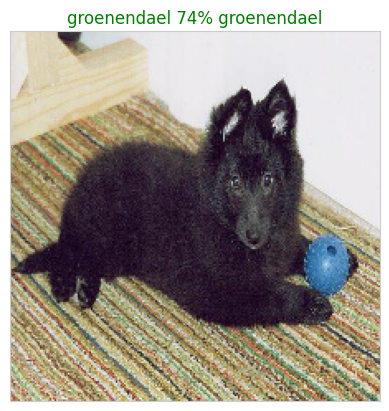

In [ ]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=77)

For this example, the model predicted correctly that this image of a dog is in fact a 'groenendael', with a high confidence of 74%.

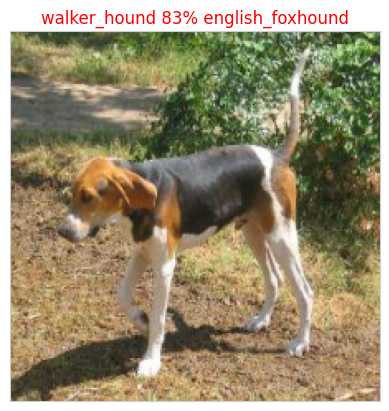

In [ ]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=42)

For this other example the model predicted that the dog is a 'walker_hound' when it is in fact an 'english_foxhound'. Looking up the other breed, these two breeds are quite similar and the model was only 83% confident in the breed as well.

Now that I visualized the top prediction I am interested in the top 10 predictions as well.

**Visualizing the TOP 10 Predictions**

Function:

* Takes an input of an array of prediction probabilities and the ground truth array as well as an integer (sample number)

* Finds the predicted label using `get_pred_label()`

* Finds the top 10 prediction probability indexes, prediction probability values as well as the prediction labels.

* Plots the top 10 prediction probability values and labels coloring the true label green.

In [79]:
#Creating a function to plot the top 10 predicted breeds
#Plotting the top 10 highest prediction probabilities along with truth labels for sample n

def plot_pred_conf(prediction_probabilities, labels, n=1):
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  #Getting the predicted label
  pred_label = get_pred_label(pred_prob)

  #Finding the top 10 prediction confidence indexes

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  #Finding the top 10 prediction confidence values

  top_10_pred_values = pred_prob[top_10_pred_indexes]

  #Finding the top 10 prediction labels

  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  #Setting up the plot

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), top_10_pred_values, color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)), labels=top_10_pred_labels, rotation="vertical")

  #Changing the color of the true label

  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

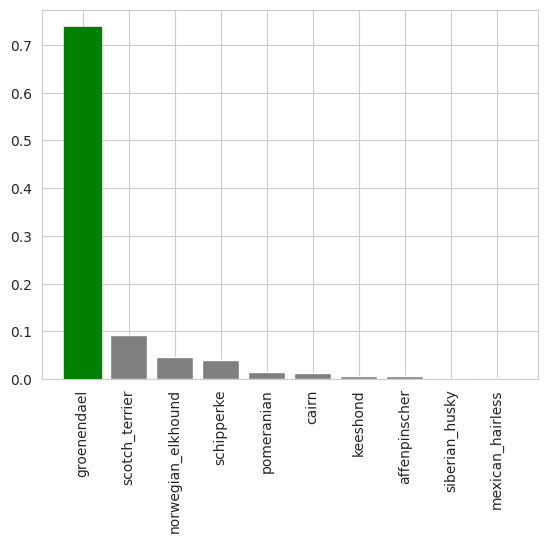

In [ ]:
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=77)

As the model predicts, this dog is definetly a 'groenendael'.

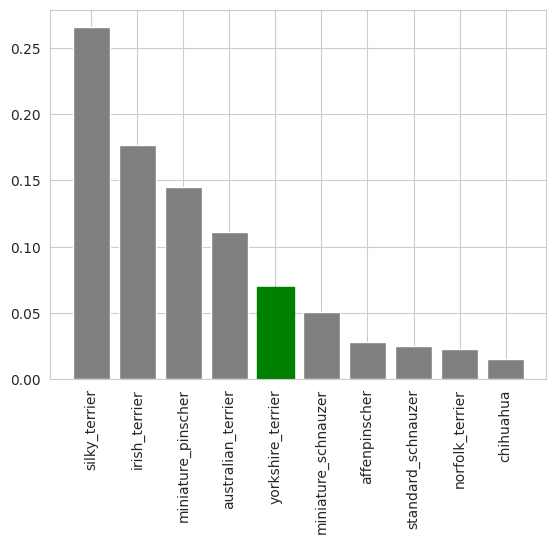

In [ ]:
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=12)

The model predicted the this dog is a 'silky_terrier', although it is a 'yorkshire_terrier'.

Now I will plot some of the predictions side-by-side to evaluate the model.

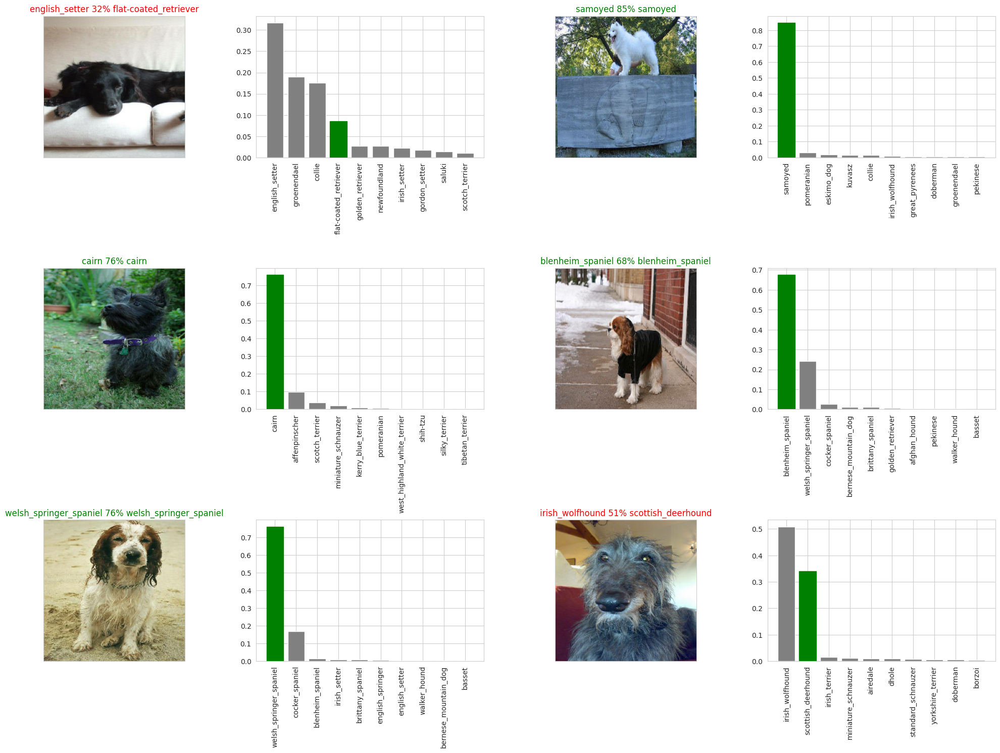

In [ ]:
#Visualizing multiple predictions

i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

### **Saving and Loading the Trained Model**

In [80]:
#Creating a function to save the model
#Saves a given model in a models directory and appends a suffix (string)

def save_model(model, suffix=None):

  #Creating a model directory pathname with current time

  modeldir = os.path.join("/content/drive/MyDrive/personal projects/dog_breed_identification/data/models", datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" #Saving the model format
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [81]:
#Creating a function to load the trained model
#Loads a saved model from a specified path

def load_model(model_path):
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
#Saving the model trained on 1000 images

save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/personal projects/dog_breed_identification/data/models/20240805-10251722853511-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/personal projects/dog_breed_identification/data/models/20240805-10251722853511-1000-images-mobilenetv2-Adam.h5'

In [82]:
#Loading the trained model

loaded_1000_image_model = load_model('/content/drive/MyDrive/personal projects/dog_breed_identification/data/models/20240804-15291722785375-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/personal projects/dog_breed_identification/data/models/20240804-15291722785375-1000-images-mobilenetv2-Adam.h5


In [91]:
#Evaluating the model

model.evaluate(val_data)

7/7 [==============================] - 1s 158ms/step - loss: 1.3137 - accuracy: 0.6750


[1.3136793375015259, 0.675000011920929]

In [83]:
#Evaluating the loaded model

loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 28s 4s/step - loss: 1.3137 - accuracy: 0.6750


[1.3136793375015259, 0.675000011920929]

## **Training a Deep Learning Model - Real Data (Entire Dataset)**

In [92]:
len(X), len(y)

(10222, 10222)

In [93]:
#Creating a data batch with the full dataset

full_data = create_data_batches(X, y)
full_data

Creating training data batches...


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [94]:
#Creating a model for the full dataset

full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [95]:
#Creating callbacks for the real data model

full_model_tensorboard = create_tensorboard_callback()

There will be no validation set when training the model on the full dataset, so I will not monitor validation accuracy.



In [96]:
#Creating early stopping callback for the real data model

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

In [ ]:
#Fitting the new model to the  full data

full_model.fit(x=full_data, epochs=NUM_EPOCHS, callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 642s 2s/step - loss: 1.3521 - accuracy: 0.6684
Epoch 2/100
320/320 [==============================] - 642s 2s/step - loss: 0.4030 - accuracy: 0.8813
Epoch 3/100
320/320 [==============================] - 659s 2s/step - loss: 0.2411 - accuracy: 0.9353
Epoch 4/100
320/320 [==============================] - 648s 2s/step - loss: 0.1563 - accuracy: 0.9635
Epoch 5/100
320/320 [==============================] - 634s 2s/step - loss: 0.1065 - accuracy: 0.9779
Epoch 6/100
320/320 [==============================] - 639s 2s/step - loss: 0.0768 - accuracy: 0.9871
Epoch 7/100
320/320 [==============================] - 636s 2s/step - loss: 0.0598 - accuracy: 0.9905
Epoch 8/100
320/320 [==============================] - 641s 2s/step - loss: 0.0462 - accuracy: 0.9941
Epoch 9/100
320/320 [==============================] - 637s 2s/step - loss: 0.0379 - accuracy: 0.9953
Epoch 10/100
320/320 [==============================] - 638s 2s/step - loss: 0.032

*! RUNS FOR ~3H30MIN*

In [ ]:
#Saving the model

save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/personal projects/dog_breed_identification/data/models/20240805-13511722865879-full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/personal projects/dog_breed_identification/data/models/20240805-13511722865879-full-image-set-mobilenetv2-Adam.h5'

In [97]:
#Loading the model

loaded_full_model = load_model('/content/drive/MyDrive/personal projects/dog_breed_identification/data/models/20240805-13511722865879-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/personal projects/dog_breed_identification/data/models/20240805-13511722865879-full-image-set-mobilenetv2-Adam.h5


## **Making and Evaluating Predictions on the Entire Dataset (Real Data)**

Since the model was trained on imgages in the form of tensor batches, to make predictions on the test data I will transform the test data into tensor batches as well. For this I will use the function I previously coded called `create_data_batches()` (takes the list of filenames as input and converts them into tensor data batches).

To make predictions on the test data I will do the following:

* Get the test image filenames

* Convert the filenames into test data batches with the `create_data_batches()` function and setting the `test_data` parameter to `True` (the test data does not have labels)

* Make a predictions array by calling the `predict()` function on the model, passing the test batches


In [98]:
#Loading test image filenames

test_path = "/content/drive/MyDrive/personal projects/dog_breed_identification/data/test/"

test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/personal projects/dog_breed_identification/data/test/e2976affb6d88a3e627ff8c31844f20a.jpg',
 '/content/drive/MyDrive/personal projects/dog_breed_identification/data/test/e2d65ef41ec9a649c8dbd92f0b821163.jpg',
 '/content/drive/MyDrive/personal projects/dog_breed_identification/data/test/e15513ca7ebb4730731f34c25e906502.jpg',
 '/content/drive/MyDrive/personal projects/dog_breed_identification/data/test/dd7fbb397a4968d9ae54d1d7b7a35ae6.jpg',
 '/content/drive/MyDrive/personal projects/dog_breed_identification/data/test/dd6ef59cad61882fec54f4b6a429065e.jpg',
 '/content/drive/MyDrive/personal projects/dog_breed_identification/data/test/e01a1ea716359e2f0062aca591ff9ca4.jpg',
 '/content/drive/MyDrive/personal projects/dog_breed_identification/data/test/e2faaf5e760a6189d0980e6355864b4c.jpg',
 '/content/drive/MyDrive/personal projects/dog_breed_identification/data/test/e7afcce6e45858fc3b294cc5c0b15a53.jpg',
 '/content/drive/MyDrive/personal projects/dog_breed_identificat

In [99]:
len(test_filenames)

10357

In [103]:
#Creating test data batches

test_data = create_data_batches(test_filenames, test_data=True)
test_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [107]:
#Making predictions on the test data using the full model

test_predictions = loaded_full_model.predict(test_data, verbose=1)
test_predictions

324/324 [==============================] - 46s 142ms/step


array([[5.57674040e-09, 8.84549411e-09, 8.31859193e-10, ...,
        1.45837745e-07, 3.06817214e-03, 3.32187233e-09],
       [2.30004016e-10, 1.34906827e-07, 8.09786682e-11, ...,
        3.77981523e-05, 1.32301529e-05, 1.93648542e-09],
       [2.74917866e-09, 6.69339670e-07, 3.26479573e-11, ...,
        6.06108452e-09, 2.78341759e-08, 4.03637583e-12],
       ...,
       [1.06285319e-11, 4.34122310e-04, 3.86965837e-08, ...,
        7.74845574e-08, 2.28980463e-11, 8.90634908e-08],
       [1.80506832e-10, 7.70025085e-11, 1.51089089e-11, ...,
        3.37167273e-11, 1.51144297e-09, 2.73753265e-09],
       [2.25567520e-09, 1.30016805e-11, 8.29088742e-10, ...,
        9.86792800e-11, 2.48243559e-09, 5.43633007e-07]], dtype=float32)

In [108]:
#Saving predictions as a .csv file

np.savetxt("/content/drive/MyDrive/personal projects/dog_breed_identification/data/preds_array.csv", test_predictions, delimiter=",")

In [109]:
#Loading the predictions from the .csv file

test_predictions = np.loadtxt("/content/drive/MyDrive/personal projects/dog_breed_identification/data/preds_array.csv", delimiter=",")

In [110]:
test_predictions[0]

array([5.57674040e-09, 8.84549411e-09, 8.31859193e-10, 2.19162377e-09,
       2.31257964e-08, 1.81060713e-08, 9.52546397e-09, 8.76555772e-11,
       1.17026513e-08, 8.19399881e-10, 8.50484394e-09, 1.25753755e-10,
       9.96034810e-09, 6.08214756e-10, 6.92217388e-13, 1.52340866e-11,
       1.36426648e-09, 9.80976278e-09, 2.11330047e-08, 1.17532720e-12,
       7.10130999e-12, 1.85909532e-09, 3.13093618e-09, 3.58233976e-08,
       1.18811339e-09, 1.76585149e-10, 1.63919902e-11, 2.73407075e-10,
       2.26644120e-11, 2.78264391e-11, 5.14530302e-12, 2.35874566e-07,
       2.64645059e-11, 1.28731747e-10, 1.86638136e-10, 5.17537231e-08,
       2.46346563e-12, 3.90267541e-11, 8.43272616e-08, 1.01482833e-07,
       1.08692335e-08, 3.55730867e-09, 5.07976430e-12, 9.21441526e-13,
       1.56740551e-10, 1.99043920e-10, 6.88006618e-13, 1.47556008e-07,
       3.61089625e-09, 9.64889713e-12, 3.75878946e-11, 1.37733602e-10,
       5.40138951e-13, 3.91582843e-11, 3.99560333e-12, 4.05797201e-10,
      

In [111]:
test_predictions.shape

(10357, 120)

## **Preparing the Test Predictions for Kaggle**

The Kaggle sample submission is ordered into a DataFrame that has an 'id' column as well as columns for each of the 120 dog breeds, the records containig all the prediction probabilities for each breed that the model outputs (https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation).

To  transform the data I will:

* Create a pandas DataFrame with an 'id' column, as well as a column for each dog breed

* Add data to the 'id' column by extracting the test image id's from their filepaths

* Add the prediction probabilities to each of the respective dog breed columns

* Export the DataFrame as a .csv file to submit to Kaggle




In [112]:
#Creating a DataFrame with empty columns

preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [117]:
#Appending test image id's to the preds_df DataFrame

test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids[:10]

['e2976affb6d88a3e627ff8c31844f20a',
 'e2d65ef41ec9a649c8dbd92f0b821163',
 'e15513ca7ebb4730731f34c25e906502',
 'dd7fbb397a4968d9ae54d1d7b7a35ae6',
 'dd6ef59cad61882fec54f4b6a429065e',
 'e01a1ea716359e2f0062aca591ff9ca4',
 'e2faaf5e760a6189d0980e6355864b4c',
 'e7afcce6e45858fc3b294cc5c0b15a53',
 'e1f9be3ecf0409189486c786ff4bd65a',
 'e431adb273c1b705e6e85147990f355e']

In [118]:
preds_df["id"] = test_ids
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e2976affb6d88a3e627ff8c31844f20a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e2d65ef41ec9a649c8dbd92f0b821163,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e15513ca7ebb4730731f34c25e906502,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,dd7fbb397a4968d9ae54d1d7b7a35ae6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,dd6ef59cad61882fec54f4b6a429065e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,07cbc12094a8f4a54700054222a25da3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10353,08699bdbc18bde158cdc4969b6c51d81,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10354,07217f9dab968cf02c4cb37acf2acc28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10355,077b4c62007a362be52711169abfa4fd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [119]:
#Adding the prediction probabilities to each dog breed column

preds_df[list(unique_breeds)] = test_predictions
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e2976affb6d88a3e627ff8c31844f20a,5.576740e-09,8.845494e-09,8.318592e-10,2.191624e-09,2.312580e-08,1.810607e-08,9.525464e-09,8.765558e-11,1.170265e-08,...,4.632900e-10,4.560415e-09,1.613319e-09,8.721147e-11,3.899546e-09,5.128080e-08,7.523475e-08,1.458377e-07,3.068172e-03,3.321872e-09
1,e2d65ef41ec9a649c8dbd92f0b821163,2.300040e-10,1.349068e-07,8.097867e-11,1.933502e-07,2.989882e-08,3.957921e-08,5.310748e-07,4.915098e-12,7.656885e-10,...,6.061369e-04,1.864286e-06,4.580510e-08,1.316573e-07,1.531184e-07,4.988112e-08,7.004746e-07,3.779815e-05,1.323015e-05,1.936485e-09
2,e15513ca7ebb4730731f34c25e906502,2.749179e-09,6.693397e-07,3.264796e-11,2.998937e-10,1.745052e-10,1.093659e-11,4.470518e-13,7.980399e-11,2.264602e-13,...,7.197176e-10,1.222423e-13,4.444640e-12,2.440564e-11,5.120298e-12,1.663758e-12,2.375929e-12,6.061085e-09,2.783418e-08,4.036376e-12
3,dd7fbb397a4968d9ae54d1d7b7a35ae6,4.315890e-12,3.361211e-09,8.626990e-13,7.877545e-09,3.284050e-09,2.754216e-08,1.804804e-09,3.997441e-09,2.320162e-08,...,2.056110e-09,1.095959e-11,1.829441e-05,5.903940e-08,1.215778e-07,6.529584e-08,3.754371e-11,1.439179e-09,9.955406e-11,4.207241e-10
4,dd6ef59cad61882fec54f4b6a429065e,1.111113e-06,2.754805e-08,1.834313e-11,5.624491e-11,9.223083e-12,1.082079e-10,1.187597e-11,4.414556e-10,5.531842e-12,...,6.968857e-08,3.894502e-10,9.307267e-13,3.302069e-11,1.042025e-11,2.941495e-11,3.122512e-10,6.031080e-11,3.442090e-09,1.276621e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,07cbc12094a8f4a54700054222a25da3,5.369964e-09,8.827588e-13,8.299841e-13,1.230116e-12,2.623368e-13,1.416483e-10,4.685755e-14,3.375415e-11,1.226100e-10,...,3.366285e-11,1.476140e-11,4.485547e-10,4.202043e-12,7.786992e-13,2.036154e-12,2.272529e-12,8.662034e-13,9.841818e-10,1.825685e-11
10353,08699bdbc18bde158cdc4969b6c51d81,1.396595e-11,5.695820e-14,4.744428e-13,3.574622e-13,5.458299e-11,6.974762e-11,6.725502e-10,7.802371e-11,7.083828e-15,...,3.528816e-12,2.764873e-13,1.422399e-13,4.474021e-13,2.549761e-12,8.524144e-13,4.144908e-14,1.451738e-16,2.059406e-14,1.133382e-10
10354,07217f9dab968cf02c4cb37acf2acc28,1.062853e-11,4.341223e-04,3.869658e-08,1.409374e-11,4.707270e-08,1.796187e-08,5.269118e-08,2.047710e-12,2.630507e-11,...,4.498829e-10,1.232786e-10,3.077607e-07,4.752764e-09,5.361950e-06,6.797835e-09,4.006779e-10,7.748456e-08,2.289805e-11,8.906349e-08
10355,077b4c62007a362be52711169abfa4fd,1.805068e-10,7.700251e-11,1.510891e-11,1.348370e-09,4.912752e-10,1.505014e-08,3.744073e-11,8.739356e-10,3.818496e-10,...,6.265160e-10,3.251023e-10,1.076010e-06,6.176036e-07,1.214920e-10,3.080767e-06,2.290713e-12,3.371673e-11,1.511443e-09,2.737533e-09


In [120]:
#Exporting the DataFrame to a .csv file

preds_df.to_csv("/content/drive/MyDrive/personal projects/dog_breed_identification/data/full_model_preds_submission.csv", index=False)

## **Making Predictions on Custom Images**

To make predictions on custom images I will:

* Get the filepaths of the custom images

* Turn the filepaths into data batches using the `create_data_batches()` function, and since the custom images will not have labels I will set the `test_data` parameter to `True`

* Pass the custom image data batch to the model and use `predict()` to get the prediction probabilities

* Convert the prediction output probabilities to prediction labels

* Compare the predicted labels to the custom images


In [154]:
#Getting custom imgage filepaths

custom_path = "/content/drive/MyDrive/personal projects/dog_breed_identification/data/my-dog-photos/"

custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

['/content/drive/MyDrive/personal projects/dog_breed_identification/data/my-dog-photos/dog3.jpg',
 '/content/drive/MyDrive/personal projects/dog_breed_identification/data/my-dog-photos/dog1.jpg',
 '/content/drive/MyDrive/personal projects/dog_breed_identification/data/my-dog-photos/dog2.jpg']

In [155]:
#Turning custom images into batches

custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [156]:
#Making predictions on the custom data

custom_preds = loaded_full_model.predict(custom_data)
custom_preds

1/1 [==============================] - 1s 998ms/step


array([[5.39569068e-04, 1.54971258e-09, 1.70297625e-07, 7.66876747e-06,
        1.41868739e-10, 1.24872453e-03, 1.44321966e-04, 5.39894609e-06,
        1.38194503e-06, 2.64284353e-07, 2.08115551e-08, 1.47627745e-07,
        3.02756078e-08, 6.40598842e-07, 4.99171183e-05, 4.61793007e-07,
        5.26118993e-06, 5.12055840e-06, 2.15159057e-10, 2.39992147e-07,
        3.56112855e-06, 4.62464600e-09, 4.00575227e-04, 3.10484694e-07,
        3.08124036e-05, 4.41233605e-10, 1.07779652e-02, 3.88599730e-08,
        2.04946696e-06, 3.31257619e-02, 5.99367045e-09, 8.56514060e-09,
        1.62692501e-07, 6.85079146e-11, 2.67060440e-09, 5.89605254e-10,
        9.04114131e-05, 1.51276595e-07, 3.69659801e-06, 3.28601004e-08,
        4.55769896e-06, 1.79761625e-03, 7.74411365e-06, 3.19418767e-08,
        3.76273856e-05, 8.98318376e-06, 7.42913144e-08, 3.14653116e-05,
        1.31811908e-06, 2.54331576e-06, 9.05742112e-08, 4.83116800e-08,
        1.32046809e-08, 4.29576152e-10, 6.10877919e-07, 2.073333

In [157]:
custom_preds.shape

(3, 120)

In [158]:
#Getting custom image prediction labels

custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['standard_schnauzer', 'bernese_mountain_dog', 'pembroke']

In [159]:
#Getting custom images (not with 'unbatchify()' since there aren't any labels)

custom_images = []

#Iterating through unbatched data

for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

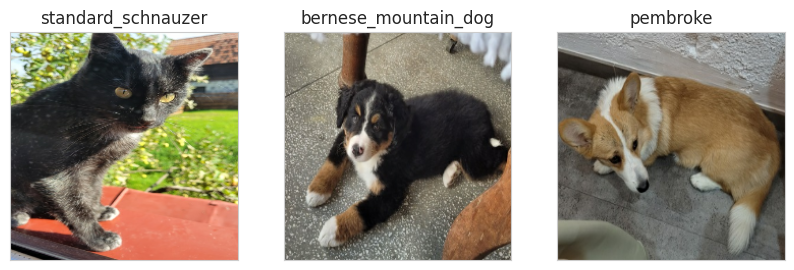

In [160]:
#Checking custom predictions

plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

The model predicted correctly for both dogs and specified my cat, Julien as a 'standard_schnauzer'. All-in-all the model performs well.